In [1]:
# from regelum.scenario import Scenario
from regelum.simulator import CasADi
import numpy as np

from regelum.utils import rg
from regelum.model import ModelWeightContainer
# Max Iteration count may be added in opt_options={"print_level": 0, "max_iter": MAX_ITER},
from regelum.optimizable.core.configs import CasadiOptimizerConfig
from regelum.predictor import EulerPredictor
from regelum.objective import RunningObjective
from regelum.critic import CriticTrivial
from regelum.scenario import RLScenario
from regelum.event import Event

import sys
sys.path.append('../')

from src.system import HydraulicSystem, StationaryHydraulicSystem
from src.observer import StationaryHydraulicObserver
from src.objective import HydraulicObjectiveModel
from src.policy import MPC
from src.animation import HydraylicAnimation

In [2]:
from regelum.callback import (
    ScenarioStepLogger,
    # StateTracker,
    # HistoricalDataCallback,
)
from src.callback import HistoricalDataCallback, SimulatorStepLogger

from regelum import set_ipython_env
%matplotlib inline
callbacks = [SimulatorStepLogger, ScenarioStepLogger, HistoricalDataCallback]
ScenarioStepLogger.cooldown = 0.01
callbacks = set_ipython_env(callbacks=callbacks, interactive=True)

In [3]:
MAX_STEP = 1e-7
PREDICTION_HORIZON = 5
FINAL_TIME = 10e-3
SAMPLING_TIME = 1e-3
ACTION_SIZE = 1

pred_step_size = 1 * SAMPLING_TIME

# Define the initial state
p_atm = 1e5
initial_state = rg.array([1e3, 0, 0, p_atm, p_atm])

model = ModelWeightContainer(
    dim_output=ACTION_SIZE, 
    weights_init=rg.zeros((PREDICTION_HORIZON + 1, ACTION_SIZE), rc_type=rg.CASADI)
)  # A trivial model contains our predicted actions

# system = HydraulicSystem(
#     init_state=initial_state
# )

# # Update observation noize std
# system.update_system_parameters(
#     {
#         "jet_length_std": 2e-1, # Was 10e-2
#         "jet_velocity_std": 1e-1, # Was 2e-2
#     }
# )

system = HydraulicSystem(
    init_state=initial_state,
    system_parameters_init = {
            "p_l_gauge": 1.5e5,
            "x_th_limits": (0., 20.),
            "freq_th": 500.0,
            "m_p": 20e-3,
            "D_th": 200e-6, # WAS 200e-6, then 5e-3
            "D_hydr": 20e-3,
            "D_work": 20e-3,
            "h_work_init": 1e3,
            "D_exit": 0.33e-3,
            "l_exit": 8.5e-3,
            "p_coulomb": 10e3, # WAS 10e3, then 1e3
            "eta": 0.70,
            "zeta_th": 5.0, # WAS 5.0, then 0.1
            "rho_hydr": 1e3,
            "rho_work": 1e3,
            "beta_v_hydr": 0.49e-9,
            "beta_v_work": 0.49e-9,
            "sigma_work": 73e-3,
            "mu_work": 1.0e-3,
            "v_j": 200.,
            "jet_length_std": 1e-1, # Was 10e-2
            "jet_velocity_std": 10, # Was 2e-2
            "pressure_std": 0.,
            "p_atm": 1e5, # Atmosphere (ambient) pressure, Pa
            "g": 9.81, # gravity constant, m/s^2
        },
)


system_model = StationaryHydraulicSystem(
    init_state=initial_state
)
observer = StationaryHydraulicObserver(
    system=system_model
)
predictor = EulerPredictor(
    system=system_model, pred_step_size=pred_step_size
)  # Predictor is used for MPC-prediction

# RUNNING OBJECTIVE
running_objective_model = HydraulicObjectiveModel(
    system=system_model,
    quad_matrix_type="diagonal", weights=[1, 0, 0]
)  # A quadratic model for running (a.k.a. instant) objective
running_objective = RunningObjective(
    model=running_objective_model
)  # Wrap `running_objective_model` into `RunningObjective` class

# Update observation noize std
system.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

system_model.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

simulator = CasADi(
    system=system,
    state_init=initial_state,
    action_init=rg.array([0]),
    time_final=FINAL_TIME,
    max_step=MAX_STEP,
)

scenario = RLScenario(
    policy=MPC(
        model=model,
        system=system_model,
        action_bounds=system_model.action_bounds,
        optimizer_config=CasadiOptimizerConfig(),
        prediction_horizon=PREDICTION_HORIZON,
        running_objective=running_objective,
        predictor=predictor
    ),
    observer = observer,
    critic=CriticTrivial(),  # mocked critic
    running_objective=running_objective,
    policy_optimization_event=Event.compute_action,  # run policy optimization on each step
    discount_factor=1.0,
    sampling_time=SAMPLING_TIME,
    simulator=simulator,
    N_episodes=1,
    N_iterations=1,
)

scenario.run()


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



[14:15:16] INFO     runn. objective: 3.59, state est.: [1000.01    3.45    0.23], observation: [   ]8;id=752901;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=748113;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    0.03 12.67], action: [20.], value: 0.0036, time: 0.0000 (0.0%), episode: 1/1,                  
                    iteration: 1/1                                                                                 

[14:15:27] INFO     runn. objective: 2.95, state est.: [1000.06  117.69    7.85], observation: [   ]8;id=580643;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=411649;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    0.21 432.29], action: [20.], value: 0.0065, time: 0.0010 (10.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:15:40] INFO     runn. objective: 1.26, state est.: [1000.22  190.79   12.75], observation: [   ]8;id=392021;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=886994;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    0.8  700.78], action: [2.62], value: 0.0078, time: 0.0020 (20.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[14:15:54] INFO     runn. objective: 0.44, state est.: [1000.34  131.52    8.78], observation: [   ]8;id=310086;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=528799;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.26 483.09], action: [-2.17], value: 0.0083, time: 0.0030 (30.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[14:16:09] INFO     runn. objective: 0.05, state est.: [1000.46   65.16    4.35], observation: [   ]8;id=795534;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=136244;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.7  239.33], action: [-4.42], value: 0.0083, time: 0.0040 (40.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[14:16:24] INFO     runn. objective: 0.00, state est.: [1000.53   10.24    0.68], observation: [   ]8;id=79690;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=166126;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.93 37.63], action: [-1.12], value: 0.0083, time: 0.0050 (50.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[14:16:41] INFO     runn. objective: 0.00, state est.: [1000.51    2.61    0.17], observation:     ]8;id=386309;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=182225;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    [1.88 9.6 ], action: [1.26], value: 0.0083, time: 0.0060 (60.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:17:00] INFO     runn. objective: 0.02, state est.: [1000.57    9.49    0.63], observation: [   ]8;id=26841;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=860478;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    2.08 34.86], action: [-2.37], value: 0.0083, time: 0.0070 (70.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[14:17:19] INFO     runn. objective: 0.00, state est.: [1000.51    3.14    0.21], observation: [   ]8;id=335547;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=912559;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.89 11.53], action: [0.87], value: 0.0083, time: 0.0080 (80.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:17:39] INFO     runn. objective: 0.00, state est.: [1000.52    1.1     0.07], observation:     ]8;id=641521;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=564826;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    [1.9  4.05], action: [0.85], value: 0.0083, time: 0.0090 (90.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:18:00] INFO     runn. objective: 0.00, state est.: [1000.54    2.43    0.16], observation:     ]8;id=558271;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=109762;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    [1.98 8.92], action: [-0.17], value: 0.0083, time: 0.0100 (100.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.594630,0.003595,1,1,20.000000,0.030352,12.667108,1000.008263,3.448620,0.229909
1,0.001000,2.953681,0.006548,1,1,20.000000,0.207675,432.289213,1000.056540,117.690738,7.853122
2,0.002000,1.263224,0.007812,1,1,2.624117,0.802371,700.784754,1000.218445,190.788649,12.749406
3,0.003000,0.442328,0.008254,1,1,-2.170707,1.261226,483.089239,1000.343369,131.521045,8.777940
4,0.004000,0.051611,0.008305,1,1,-4.420124,1.699122,239.328896,1000.462586,65.157292,4.345024
5,0.005000,0.000014,0.008305,1,1,-1.115048,1.930044,37.629343,1000.525454,10.244589,0.682978
6,0.006000,0.002413,0.008308,1,1,1.260481,1.877176,9.601952,1000.511061,2.614131,0.174276
7,0.007000,0.022938,0.008331,1,1,-2.373329,2.077755,34.861963,1000.565669,9.491169,0.632749
8,0.008000,0.001697,0.008333,1,1,0.867566,1.885105,11.532113,1000.513220,3.139618,0.209308
9,0.009000,0.000862,0.008333,1,1,0.845234,1.896941,4.051724,1000.516442,1.103082,0.073539


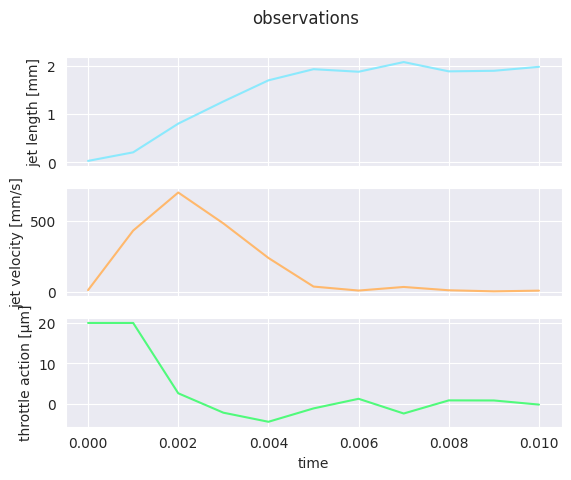

In [4]:
display(callbacks[-1].data)
callbacks[-1].plot(name="observations");

In [5]:
display(callbacks[0].data)

,time,jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm],hydraulic pressure [Pa],working pressure [Pa]
0,0.000000e+00,0.000000,0.000000,1000.000000,0.000000,0.000000,100000.000000,100000.000000
1,1.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.001000,100000.001581,100000.000000
2,2.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.002000,100000.006323,100000.000000
3,3.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.003000,100000.014227,100000.000000
4,4.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.004000,100000.025291,100000.000000
...,...,...,...,...,...,...,...,...
99997,9.999700e-03,1.920187,0.121193,1000.522771,0.032995,0.167216,109011.869713,100000.000304
99998,9.999800e-03,1.920188,0.909297,1000.522771,0.247556,0.167200,109012.286614,100000.001428
99999,9.999900e-03,1.920188,0.738430,1000.522771,0.201038,0.167183,109012.771767,100000.000827
100000,1.000000e-02,1.920188,1.531857,1000.522771,0.417048,0.167166,109013.202198,100000.004003


## Display data and animation

In [6]:
state_trajectory = callbacks[0].data
observations = callbacks[-1].data
display(observations)
# callbacks[-1].plot(name="observations"); # Replace plot to own plot function!

# Clean callback
callbacks[0].reset()
callbacks[-1].clear_recent_data()

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.594630,0.003595,1,1,20.000000,0.030352,12.667108,1000.008263,3.448620,0.229909
1,0.001000,2.953681,0.006548,1,1,20.000000,0.207675,432.289213,1000.056540,117.690738,7.853122
2,0.002000,1.263224,0.007812,1,1,2.624117,0.802371,700.784754,1000.218445,190.788649,12.749406
3,0.003000,0.442328,0.008254,1,1,-2.170707,1.261226,483.089239,1000.343369,131.521045,8.777940
4,0.004000,0.051611,0.008305,1,1,-4.420124,1.699122,239.328896,1000.462586,65.157292,4.345024
5,0.005000,0.000014,0.008305,1,1,-1.115048,1.930044,37.629343,1000.525454,10.244589,0.682978
6,0.006000,0.002413,0.008308,1,1,1.260481,1.877176,9.601952,1000.511061,2.614131,0.174276
7,0.007000,0.022938,0.008331,1,1,-2.373329,2.077755,34.861963,1000.565669,9.491169,0.632749
8,0.008000,0.001697,0.008333,1,1,0.867566,1.885105,11.532113,1000.513220,3.139618,0.209308
9,0.009000,0.000862,0.008333,1,1,0.845234,1.896941,4.051724,1000.516442,1.103082,0.073539


In [7]:
l_crit = system._parameters["l_crit"]
D_drop = system._parameters["D_drop"]
D_exit = system._parameters["D_exit"]*1e3
D_drop_rel = D_drop/D_exit

anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
anim_cl.animate_system(interacitve=True)

[14:23:07] INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>                ]8;id=784813;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=75696;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

Once 
 
 Loop 
 
 Reflect

Save results

[14:24:48] INFO     Animation.save using <class 'matplotlib.animation.PillowWriter'>              ]8;id=378286;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=805220;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

FileNotFoundError: [Errno 2] No such file or directory: '../resulst/system_last_observation_mpc_noize.pdf'

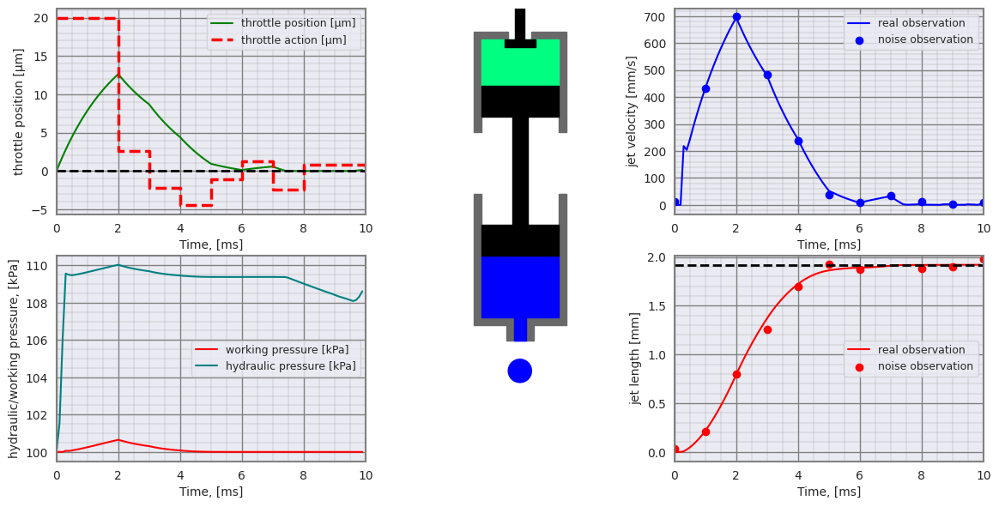

In [8]:
anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
# save animation
anim_cl.animate_system(save_gif=True, gif_filename = '../results/system_animation_mpc_noize.gif')
# save last frame
anim_cl.save_last_frame('../resulst/system_last_observation_mpc_noize.pdf')